In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.metrics import accuracy_score
import joblib

In [2]:
df = pd.read_csv('Dataset/blood_pressure_glucose_data_10days.csv')

In [3]:
df['Date'] = pd.to_datetime(df['Date'], format="%d-%m-%Y")

In [4]:
from groups import groups

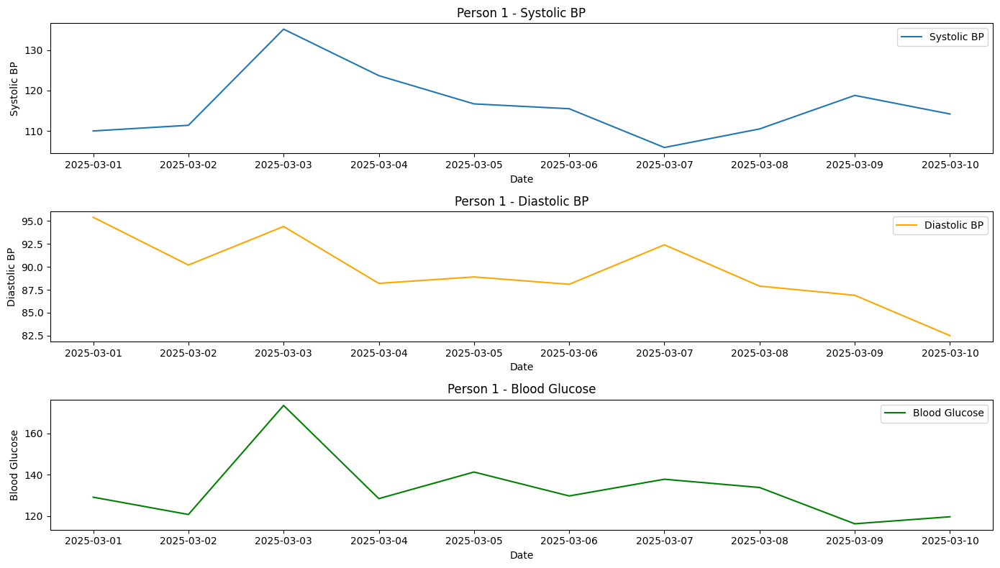

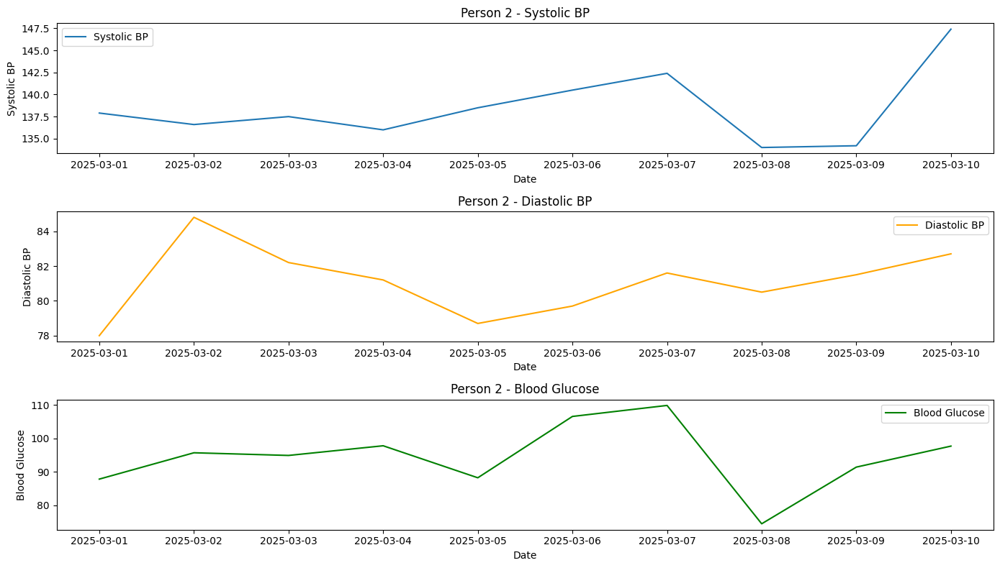

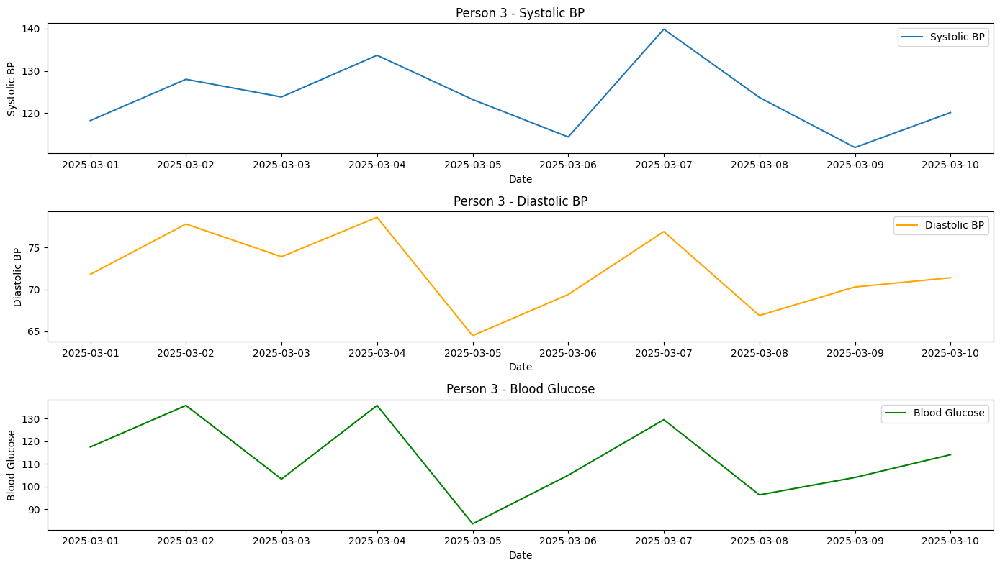

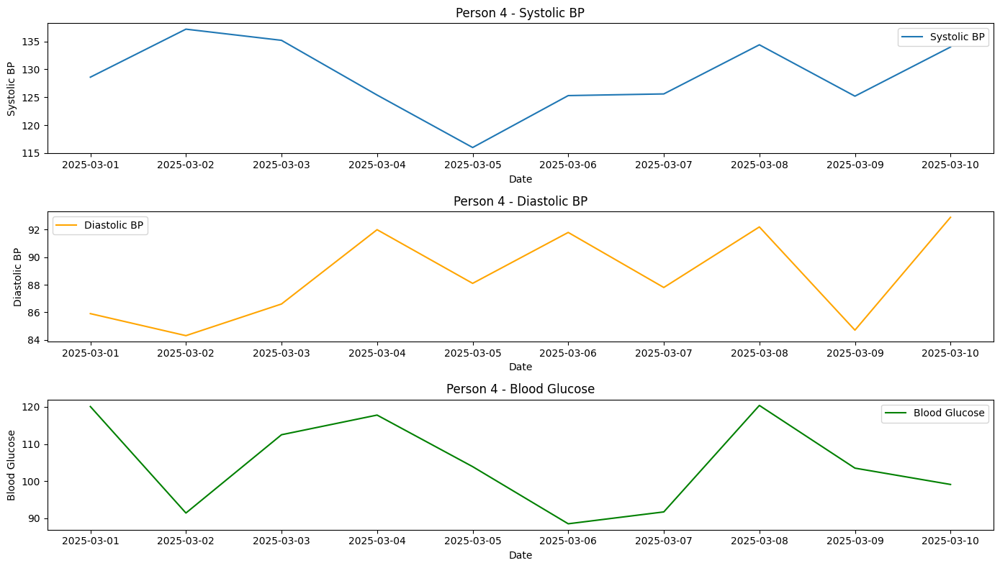

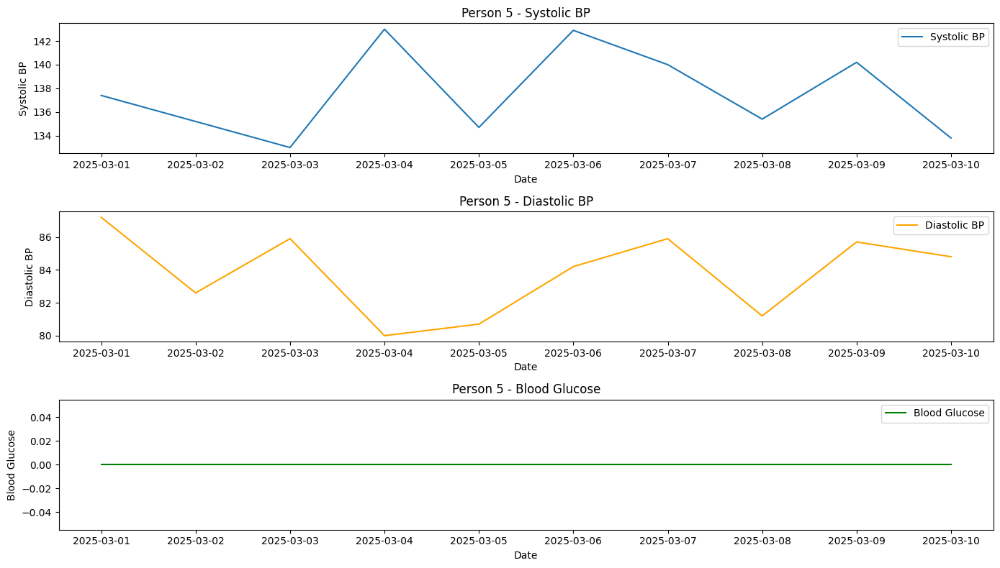

...

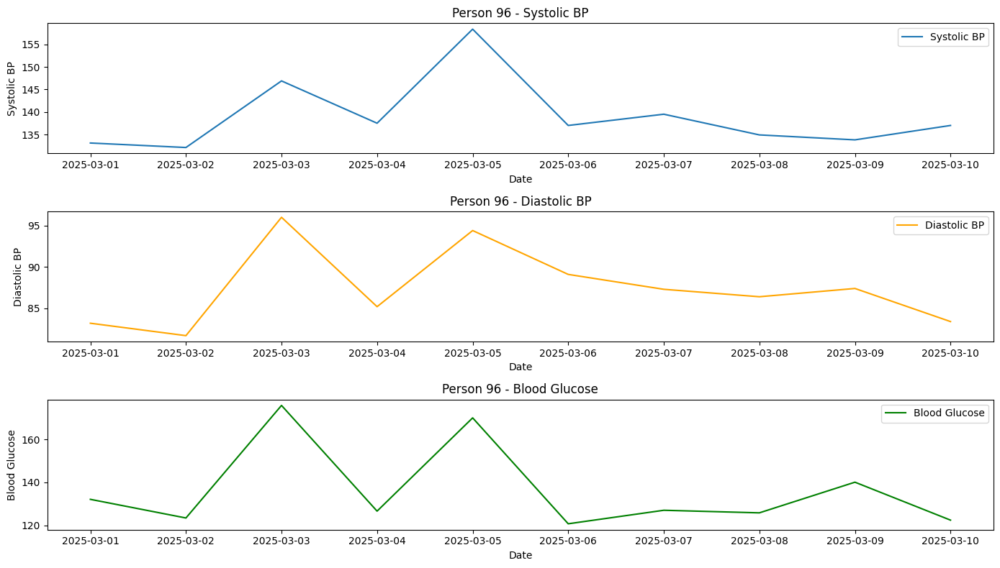

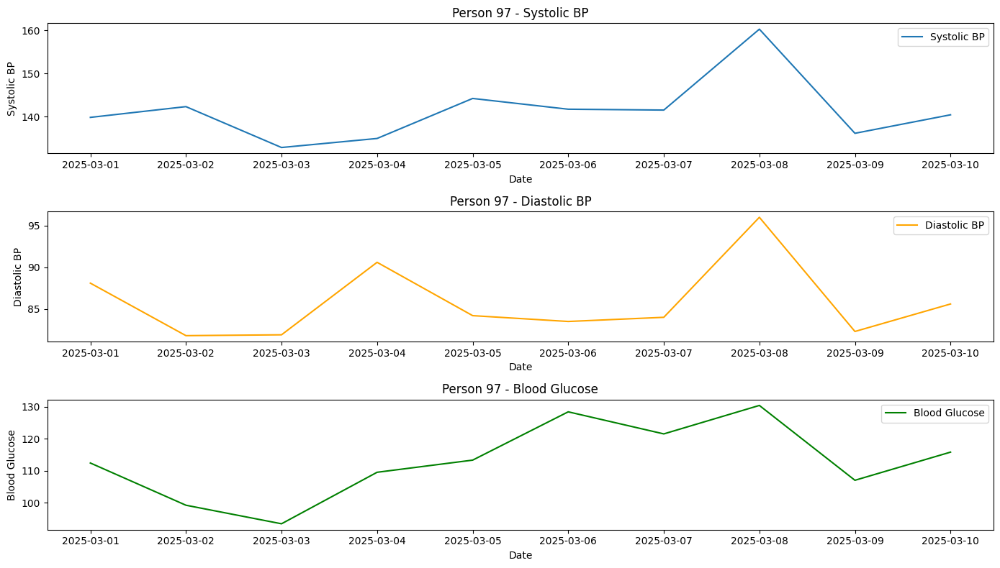

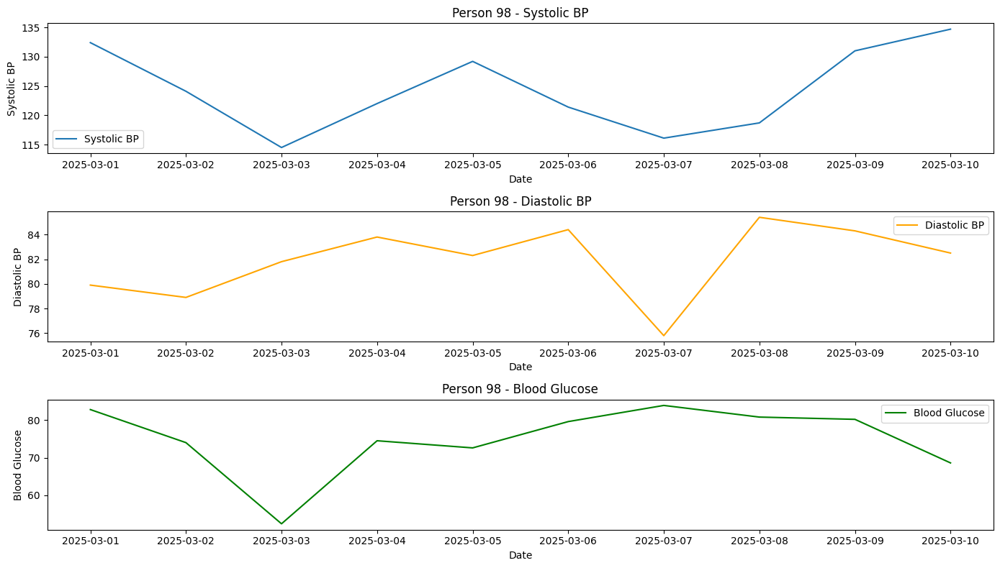

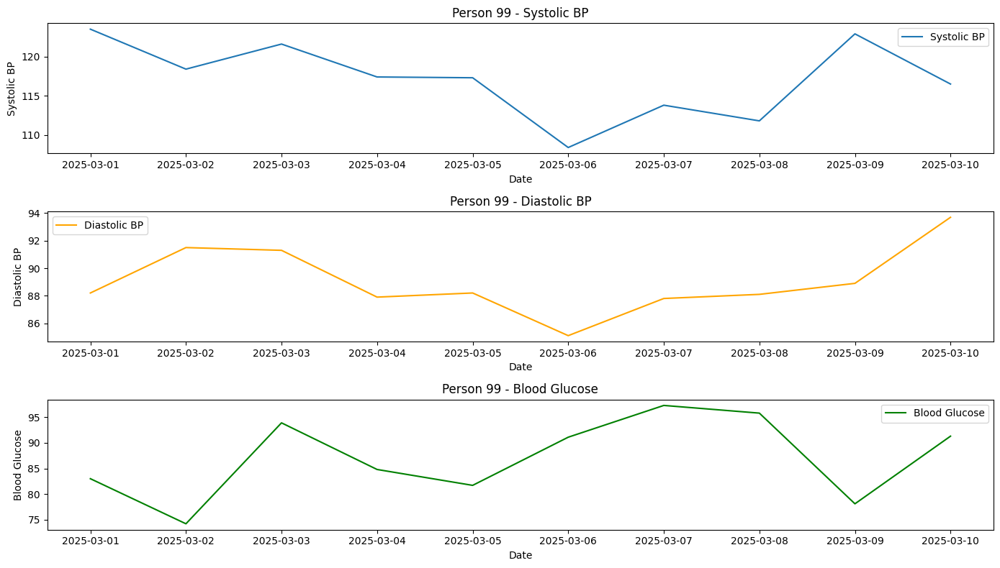

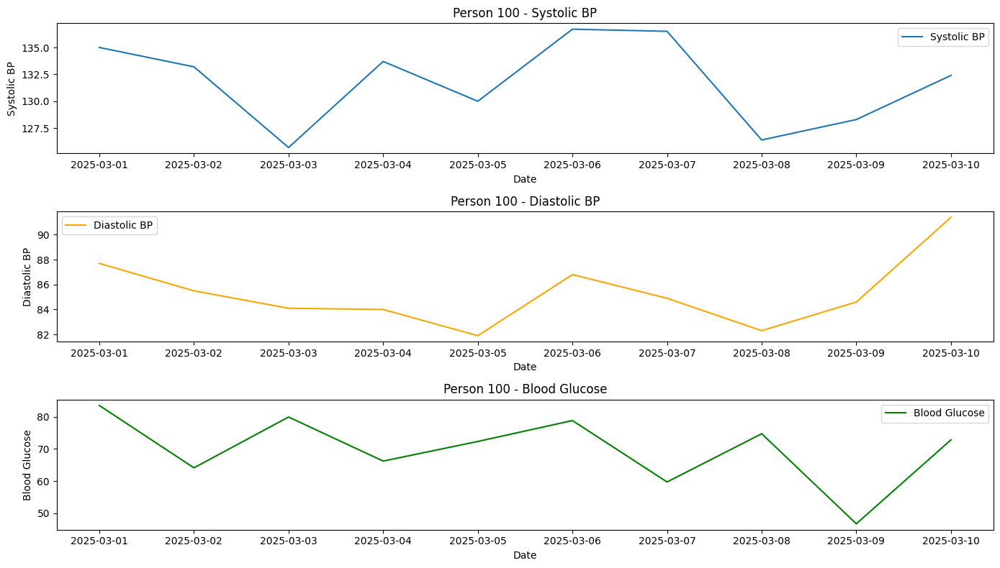

In [5]:
def plot_individual_graphs(df):
    persons = df['PersonID'].unique()
    for person in persons:
        person_data = df[df['PersonID'] == person]
        plt.figure(figsize=(14, 8))
        
        # Systolic BP
        plt.subplot(3, 1, 1)
        plt.plot(person_data['Date'], person_data['SystolicBP'], label='Systolic BP')
        plt.title(f'Person {person} - Systolic BP')
        plt.xlabel('Date')
        plt.ylabel('Systolic BP')
        plt.legend()
        
        # Diastolic BP
        plt.subplot(3, 1, 2)
        plt.plot(person_data['Date'], person_data['DiastolicBP'], label='Diastolic BP', color='orange')
        plt.title(f'Person {person} - Diastolic BP')
        plt.xlabel('Date')
        plt.ylabel('Diastolic BP')
        plt.legend()
        
        # Blood Glucose
        plt.subplot(3, 1, 3)
        plt.plot(person_data['Date'], person_data['BloodGlucose'], label='Blood Glucose', color='green')
        plt.title(f'Person {person} - Blood Glucose')
        plt.xlabel('Date')
        plt.ylabel('Blood Glucose')
        plt.legend()
        
        plt.tight_layout()
        plt.show()

plot_individual_graphs(df)

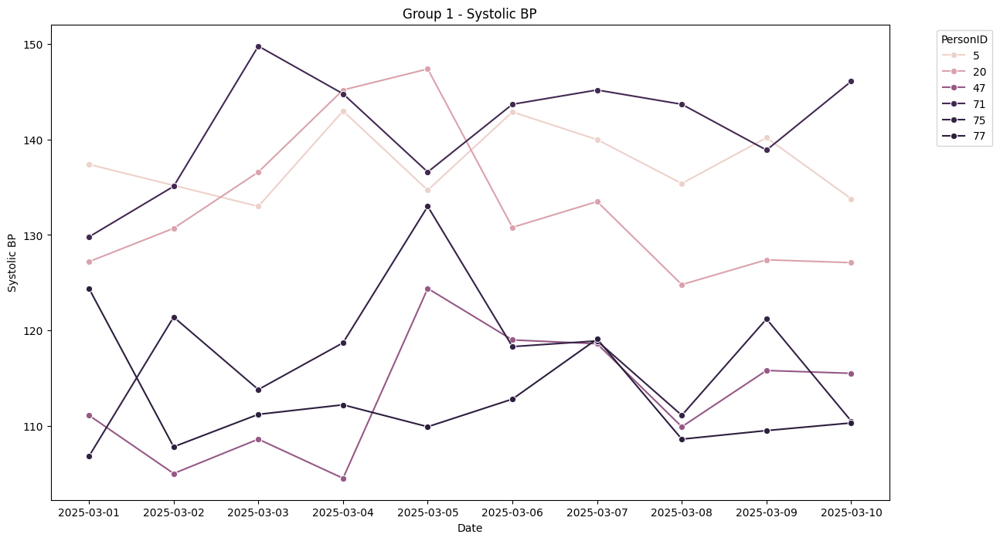

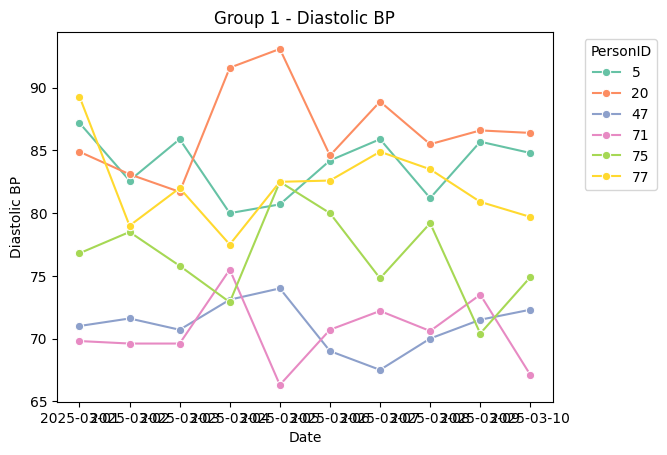

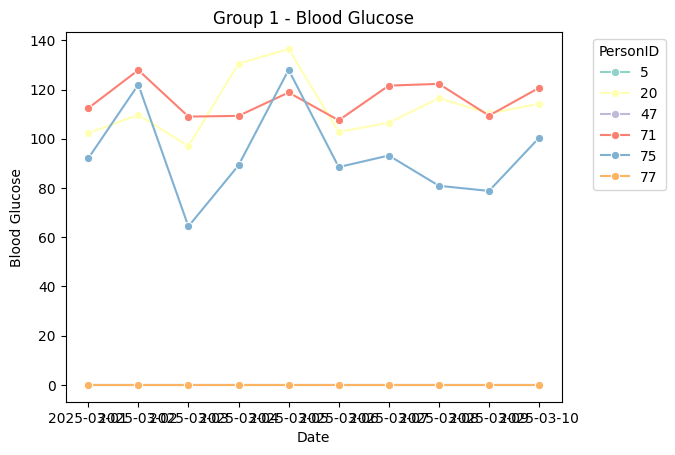

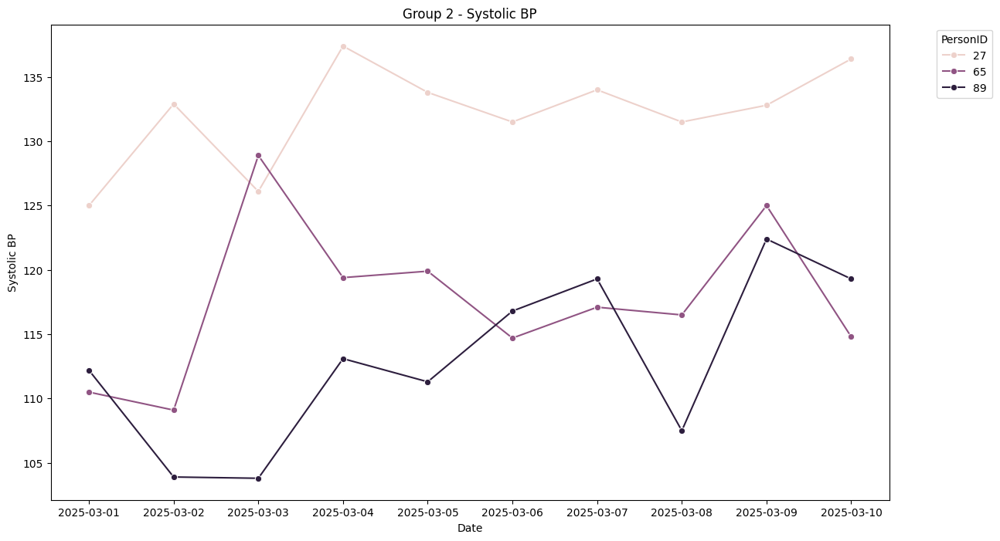

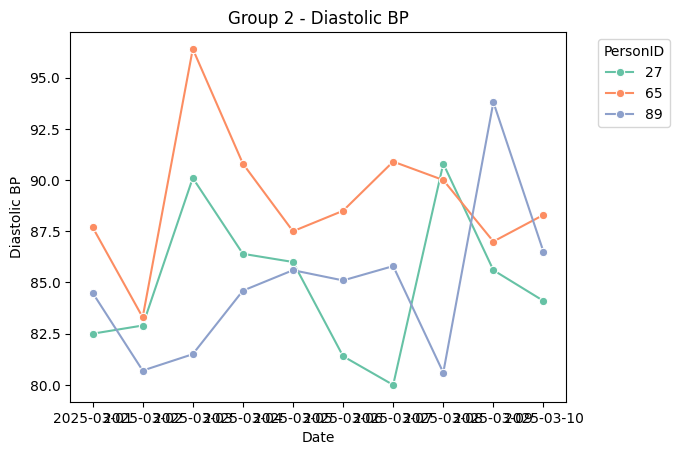

...

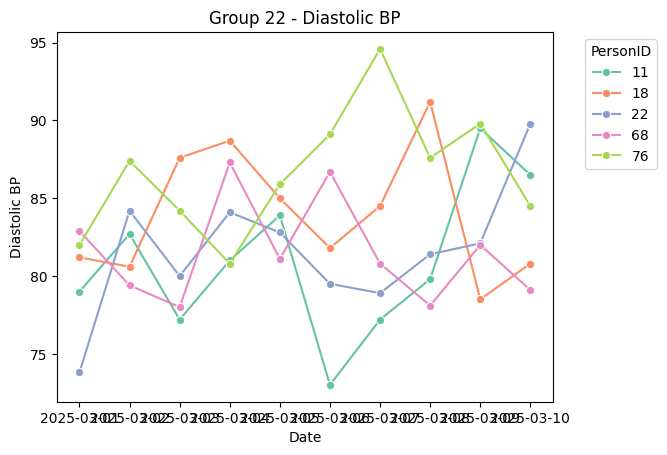

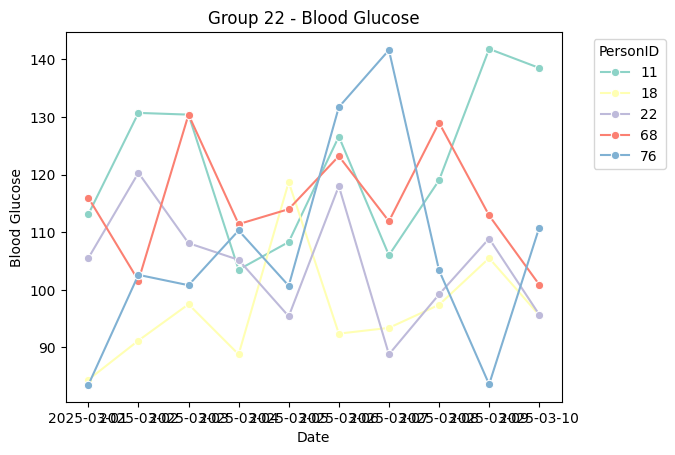

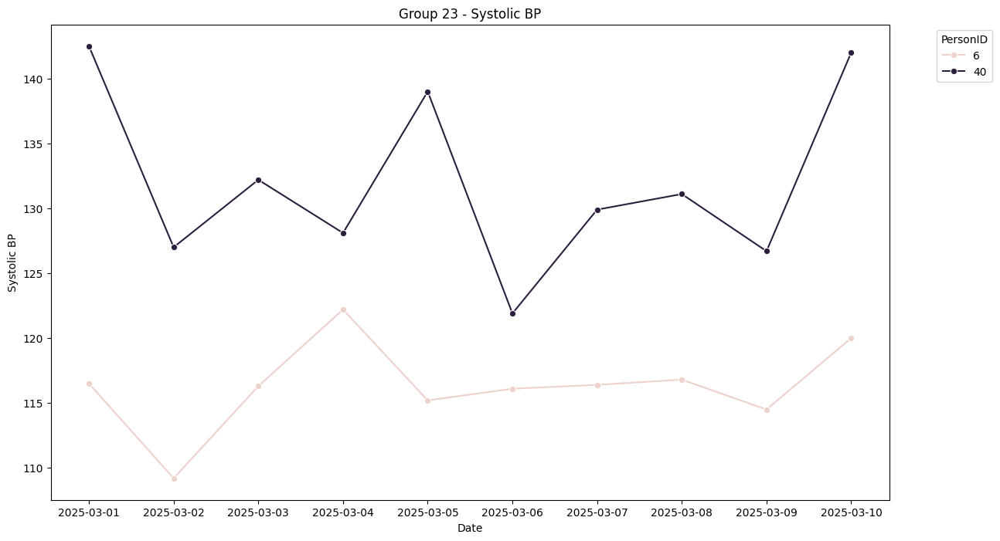

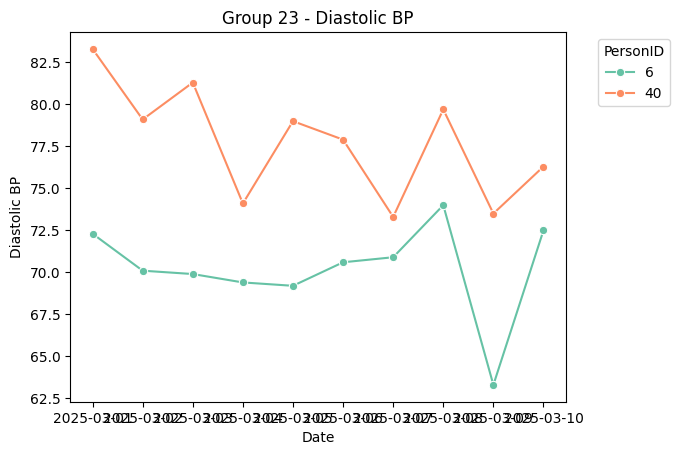

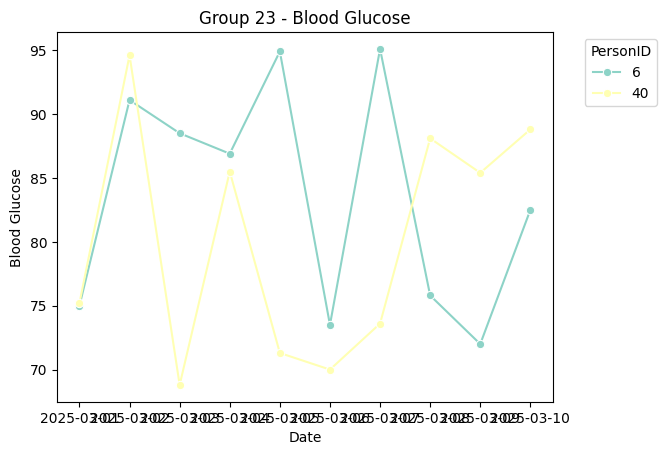

In [6]:
def plot_group_graphs(df, groups):
    for group, persons in groups.items():
        group_data = df[df['PersonID'].isin(persons)]
        plt.figure(figsize=(14, 8))
        
        # Systolic BP
        sns.lineplot(data=group_data, x='Date', y='SystolicBP', hue='PersonID', marker="o")
        plt.title(f'{group} - Systolic BP')
        plt.xlabel('Date')
        plt.ylabel('Systolic BP')
        plt.legend(title='PersonID', bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.show()
        
        # Diastolic BP
        sns.lineplot(data=group_data, x='Date', y='DiastolicBP', hue='PersonID', marker="o", palette="Set2")
        plt.title(f'{group} - Diastolic BP')
        plt.xlabel('Date')
        plt.ylabel('Diastolic BP')
        plt.legend(title='PersonID', bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.show()
        
        # Blood Glucose
        sns.lineplot(data=group_data, x='Date', y='BloodGlucose', hue='PersonID', marker="o", palette="Set3")
        plt.title(f'{group} - Blood Glucose')
        plt.xlabel('Date')
        plt.ylabel('Blood Glucose')
        plt.legend(title='PersonID', bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.show()

plot_group_graphs(df, groups)

In [7]:
import os

accuracy_results = []

def train_models_for_groups(df, groups):
    for group_name, person_ids in groups.items():
        group_data = df[df['PersonID'].isin(person_ids)]

        X_bp = group_data[['SystolicBP', 'DiastolicBP']]
        y_bp = group_data['PersonID']
        
        X_bp_train, X_bp_test, y_bp_train, y_bp_test = train_test_split(X_bp, y_bp, test_size=0.2, random_state=42)
        bp_model_knn = KNeighborsClassifier(n_neighbors=3)
        bp_model_gb = GradientBoostingClassifier(n_estimators=100)
        bp_model_ab = AdaBoostClassifier(n_estimators=100)
        bp_model_rf = RandomForestClassifier(n_estimators=100)
        bp_model_gnb = GaussianNB()
        bp_model_mnb = MultinomialNB()
        bp_model_knn.fit(X_bp_train, y_bp_train)
        bp_model_gb.fit(X_bp_train, y_bp_train)
        bp_model_ab.fit(X_bp_train, y_bp_train)
        bp_model_rf.fit(X_bp_train, y_bp_train)
        bp_model_gnb.fit(X_bp_train, y_bp_train)
        bp_model_mnb.fit(X_bp_train, y_bp_train)

        os.makedirs(f'10_Days_Models/{group_name}', exist_ok=True)
        
        joblib.dump(bp_model_knn, f'10_Days_Models/{group_name}/bp_model_knn.pkl')
        joblib.dump(bp_model_gb, f'10_Days_Models/{group_name}/bp_model_gb.pkl')
        joblib.dump(bp_model_ab, f'10_Days_Models/{group_name}/bp_model_ab.pkl')
        joblib.dump(bp_model_rf, f'10_Days_Models/{group_name}/bp_model_rf.pkl')
        joblib.dump(bp_model_gnb, f'10_Days_Models/{group_name}/bp_model_gnb.pkl')
        joblib.dump(bp_model_mnb, f'10_Days_Models/{group_name}/bp_model_mnb.pkl')

        y_bp_pred_knn = bp_model_knn.predict(X_bp_test)
        y_bp_pred_gb = bp_model_gb.predict(X_bp_test)
        y_bp_pred_ab = bp_model_ab.predict(X_bp_test)
        y_bp_pred_rf = bp_model_rf.predict(X_bp_test)
        y_bp_pred_gnb = bp_model_gnb.predict(X_bp_test)
        y_bp_pred_mnb = bp_model_mnb.predict(X_bp_test)

        bp_accuracy_knn = accuracy_score(y_bp_test, y_bp_pred_knn)
        bp_accuracy_gb = accuracy_score(y_bp_test, y_bp_pred_gb)
        bp_accuracy_ab = accuracy_score(y_bp_test, y_bp_pred_ab)
        bp_accuracy_rf = accuracy_score(y_bp_test, y_bp_pred_rf)
        bp_accuracy_gnb = accuracy_score(y_bp_test, y_bp_pred_gnb)
        bp_accuracy_mnb = accuracy_score(y_bp_test, y_bp_pred_mnb)

        accuracy_results.append({'Group': group_name, 'Model': 'BP_KNN', 'Accuracy': bp_accuracy_knn})
        accuracy_results.append({'Group': group_name, 'Model': 'BP_GB', 'Accuracy': bp_accuracy_gb})
        accuracy_results.append({'Group': group_name, 'Model': 'BP_AB', 'Accuracy': bp_accuracy_ab})
        accuracy_results.append({'Group': group_name, 'Model': 'BP_RF', 'Accuracy': bp_accuracy_rf})
        accuracy_results.append({'Group': group_name, 'Model': 'BP_GNB', 'Accuracy': bp_accuracy_gnb})
        accuracy_results.append({'Group': group_name, 'Model': 'BP_MNB', 'Accuracy': bp_accuracy_mnb})

        print(f"Accuracy for Blood Pressure Readings for {group_name}:", [bp_accuracy_knn, bp_accuracy_gb, bp_accuracy_ab, bp_accuracy_rf, bp_accuracy_gnb, bp_accuracy_mnb])

        group_data_non_zero_glucose = group_data[group_data['BloodGlucose'] > 0]
        if not group_data_non_zero_glucose.empty:
            X_glucose = group_data_non_zero_glucose[['BloodGlucose']]
            y_glucose = group_data_non_zero_glucose['PersonID']
            
            X_glucose_train, X_glucose_test, y_glucose_train, y_glucose_test = train_test_split(X_glucose, y_glucose, test_size=0.2, random_state=42)
            glucose_model_knn = KNeighborsClassifier(n_neighbors=3)
            glucose_model_gb = GradientBoostingClassifier(n_estimators=100)
            glucose_model_ab = AdaBoostClassifier(n_estimators=100)
            glucose_model_rf = RandomForestClassifier(n_estimators=100)
            glucose_model_gnb = GaussianNB()
            glucose_model_mnb = MultinomialNB()

            glucose_model_knn.fit(X_glucose_train, y_glucose_train)
            glucose_model_rf.fit(X_glucose_train, y_glucose_train)

            joblib.dump(glucose_model_knn, f'10_Days_Models/{group_name}/glucose_model_knn.pkl')
            joblib.dump(glucose_model_rf, f'10_Days_Models/{group_name}/glucose_model_rf.pkl')

            y_glucose_pred_knn = glucose_model_knn.predict(X_glucose_test)
            y_glucose_pred_rf = glucose_model_rf.predict(X_glucose_test)

            glucose_accuracy_knn = accuracy_score(y_glucose_test, y_glucose_pred_knn)
            glucose_accuracy_rf = accuracy_score(y_glucose_test, y_glucose_pred_rf)

            accuracy_results.append({'Group': group_name, 'Model': 'Glucose_KNN', 'Accuracy': glucose_accuracy_knn})
            accuracy_results.append({'Group': group_name, 'Model': 'Glucose_RF', 'Accuracy': glucose_accuracy_rf})

            if y_glucose.nunique() > 1:
                glucose_model_gb.fit(X_glucose_train, y_glucose_train)
                glucose_model_ab.fit(X_glucose_train, y_glucose_train)
                glucose_model_gnb.fit(X_glucose_train, y_glucose_train)
                glucose_model_mnb.fit(X_glucose_train, y_glucose_train)

                joblib.dump(glucose_model_gb, f'10_Days_Models/{group_name}/glucose_model_gb.pkl')
                joblib.dump(glucose_model_ab, f'10_Days_Models/{group_name}/glucose_model_ab.pkl')
                joblib.dump(glucose_model_gnb, f'10_Days_Models/{group_name}/glucose_model_gnb.pkl')
                joblib.dump(glucose_model_mnb, f'10_Days_Models/{group_name}/glucose_model_mnb.pkl')
            
                y_glucose_pred_gb = glucose_model_gb.predict(X_glucose_test)
                y_glucose_pred_ab = glucose_model_ab.predict(X_glucose_test)
                y_glucose_pred_gnb = glucose_model_gnb.predict(X_glucose_test)
                y_glucose_pred_mnb = glucose_model_mnb.predict(X_glucose_test)

                glucose_accuracy_gb = accuracy_score(y_glucose_test, y_glucose_pred_gb)
                glucose_accuracy_ab = accuracy_score(y_glucose_test, y_glucose_pred_ab)
                glucose_accuracy_gnb = accuracy_score(y_glucose_test, y_glucose_pred_gnb)
                glucose_accuracy_mnb = accuracy_score(y_glucose_test, y_glucose_pred_mnb)
                
                accuracy_results.append({'Group': group_name, 'Model': 'Glucose_GB', 'Accuracy': glucose_accuracy_gb})
                accuracy_results.append({'Group': group_name, 'Model': 'Glucose_AB', 'Accuracy': glucose_accuracy_ab})
                accuracy_results.append({'Group': group_name, 'Model': 'Glucose_GNB', 'Accuracy': glucose_accuracy_gnb})
                accuracy_results.append({'Group': group_name, 'Model': 'Glucose_MNB', 'Accuracy': glucose_accuracy_mnb})
                
                print(f"Accuracy for Blood Glucose Readings for {group_name}:", [glucose_accuracy_knn, glucose_accuracy_gb, glucose_accuracy_ab, glucose_accuracy_rf, glucose_accuracy_gnb, glucose_accuracy_mnb])
            
            else:
                print(f"Accuracy for Blood Glucose Readings for {group_name}:", [glucose_accuracy_knn, glucose_accuracy_rf])
        else:
            print(f'No non-zero glucose data for {group_name}, skipping Glucose model.')

train_models_for_groups(df, groups)

c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Pressure Readings for Group 1: [0.5833333333333334, 0.6666666666666666, 0.4166666666666667, 0.6666666666666666, 0.6666666666666666, 0.4166666666666667]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Glucose Readings for Group 1: [0.8333333333333334, 0.5, 0.6666666666666666, 0.5, 0.5, 0.3333333333333333]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Pressure Readings for Group 2: [1.0, 0.8333333333333334, 1.0, 1.0, 1.0, 1.0]
Accuracy for Blood Glucose Readings for Group 2: [1.0, 1.0]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Pressure Readings for Group 3: [0.8333333333333334, 0.75, 0.5, 0.75, 0.75, 0.3333333333333333]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Glucose Readings for Group 3: [0.5, 0.5, 0.5, 0.5, 0.5, 0.3333333333333333]
Accuracy for Blood Pressure Readings for Group 4: [0.75, 0.5, 0.75, 0.5, 0.75, 1.0]
Accuracy for Blood Glucose Readings for Group 4: [1.0, 1.0]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Pressure Readings for Group 5: [0.35714285714285715, 0.35714285714285715, 0.35714285714285715, 0.42857142857142855, 0.42857142857142855, 0.2857142857142857]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Glucose Readings for Group 5: [0.8333333333333334, 0.8333333333333334, 0.6666666666666666, 0.8333333333333334, 1.0, 0.3333333333333333]
Accuracy for Blood Pressure Readings for Group 6: [1.0, 1.0, 1.0, 1.0, 1.0, 0.75]
Accuracy for Blood Glucose Readings for Group 6: [1.0, 1.0]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Pressure Readings for Group 7: [0.6, 0.4, 0.5, 0.4, 0.5, 0.2]
Accuracy for Blood Glucose Readings for Group 7: [1.0, 1.0, 1.0, 1.0, 1.0, 0.5]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Pressure Readings for Group 8: [1.0, 0.6666666666666666, 0.8333333333333334, 1.0, 1.0, 0.6666666666666666]
Accuracy for Blood Glucose Readings for Group 8: [1.0, 1.0]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Pressure Readings for Group 9: [0.9, 0.8, 0.5, 0.9, 0.9, 0.0]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Glucose Readings for Group 9: [1.0, 0.75, 0.75, 0.75, 0.75, 0.5]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Pressure Readings for Group 10: [0.7, 0.8, 0.3, 0.8, 0.7, 0.1]
Accuracy for Blood Glucose Readings for Group 10: [1.0, 1.0, 1.0, 1.0, 1.0, 0.5]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Pressure Readings for Group 11: [0.8, 0.7, 0.3, 0.7, 0.7, 0.2]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Glucose Readings for Group 11: [0.5, 0.5, 0.5, 0.5, 0.5, 0.5]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Pressure Readings for Group 12: [0.5833333333333334, 0.5833333333333334, 0.4166666666666667, 0.6666666666666666, 0.5833333333333334, 0.25]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Glucose Readings for Group 12: [0.6, 0.4, 0.3, 0.4, 0.6, 0.0]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Pressure Readings for Group 13: [0.42857142857142855, 0.35714285714285715, 0.21428571428571427, 0.35714285714285715, 0.21428571428571427, 0.14285714285714285]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Glucose Readings for Group 13: [0.2857142857142857, 0.35714285714285715, 0.42857142857142855, 0.42857142857142855, 0.21428571428571427, 0.07142857142857142]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Pressure Readings for Group 14: [0.6666666666666666, 0.8333333333333334, 0.8333333333333334, 0.6666666666666666, 0.6666666666666666, 0.6666666666666666]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Glucose Readings for Group 14: [0.8333333333333334, 0.5, 0.5, 0.5, 0.8333333333333334, 0.3333333333333333]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Pressure Readings for Group 15: [0.5833333333333334, 0.25, 0.25, 0.4166666666666667, 0.3333333333333333, 0.16666666666666666]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Glucose Readings for Group 15: [0.3333333333333333, 0.4166666666666667, 0.25, 0.4166666666666667, 0.25, 0.0]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Pressure Readings for Group 16: [0.5, 0.375, 0.625, 0.5, 0.25, 0.25]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Glucose Readings for Group 16: [0.625, 0.5, 0.375, 0.5, 0.625, 0.125]
Accuracy for Blood Pressure Readings for Group 17: [1.0, 0.75, 1.0, 1.0, 1.0, 1.0]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Glucose Readings for Group 17: [1.0, 1.0, 1.0, 1.0, 1.0, 0.5]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Pressure Readings for Group 18: [0.2857142857142857, 0.2857142857142857, 0.42857142857142855, 0.2857142857142857, 0.07142857142857142, 0.14285714285714285]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Glucose Readings for Group 18: [0.5714285714285714, 0.35714285714285715, 0.21428571428571427, 0.35714285714285715, 0.42857142857142855, 0.07142857142857142]
Accuracy for Blood Pressure Readings for Group 19: [1.0, 0.75, 1.0, 0.75, 1.0, 0.75]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Glucose Readings for Group 19: [0.25, 0.5, 0.5, 0.5, 0.75, 0.5]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Pressure Readings for Group 20: [0.5, 0.7, 0.3, 0.7, 0.6, 0.3]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Glucose Readings for Group 20: [0.3, 0.4, 0.4, 0.4, 0.5, 0.0]
Accuracy for Blood Pressure Readings for Group 21: [1.0, 1.0, 1.0, 1.0, 1.0, 0.5]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Glucose Readings for Group 21: [1.0, 1.0, 1.0, 1.0, 1.0, 0.5]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Pressure Readings for Group 22: [0.4, 0.6, 0.9, 0.6, 0.7, 0.2]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy for Blood Glucose Readings for Group 22: [0.1, 0.4, 0.2, 0.4, 0.4, 0.0]
Accuracy for Blood Pressure Readings for Group 23: [0.75, 0.75, 0.75, 1.0, 1.0, 0.5]
Accuracy for Blood Glucose Readings for Group 23: [0.25, 0.25, 0.25, 0.25, 0.5, 0.5]


c:\Users\nabhp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


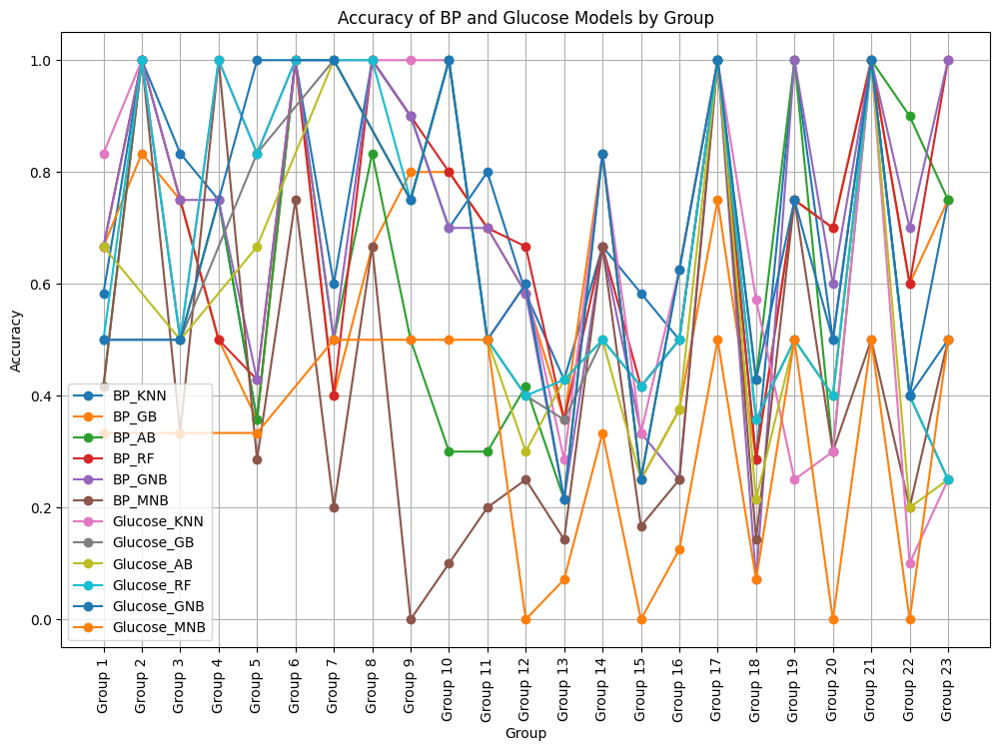

In [8]:
accuracy_df = pd.DataFrame(accuracy_results)
accuracy_df.to_csv('10_days_model_accuracies.csv', index=False)

plt.figure(figsize=(12, 8))
for model_type in ['BP_KNN', 'BP_GB', 'BP_AB', 'BP_RF', 'BP_GNB', 'BP_MNB', 'Glucose_KNN', 'Glucose_GB', 'Glucose_AB', 'Glucose_RF', 'Glucose_GNB', 'Glucose_MNB']:
    model_accuracies = accuracy_df[accuracy_df['Model'] == model_type]
    plt.plot(model_accuracies['Group'], model_accuracies['Accuracy'], marker='o', label=model_type)

plt.xlabel('Group')
plt.ylabel('Accuracy')
plt.title('Accuracy of BP and Glucose Models by Group')
plt.xticks(rotation=90)
plt.legend()
plt.grid(True)
plt.show()

In [9]:
average_bp_knn_accuracy = accuracy_df[accuracy_df['Model'] == 'BP_KNN']['Accuracy'].mean()
average_bp_gb_accuracy = accuracy_df[accuracy_df['Model'] == 'BP_GB']['Accuracy'].mean()
average_bp_ab_accuracy = accuracy_df[accuracy_df['Model'] == 'BP_AB']['Accuracy'].mean()
average_bp_rf_accuracy = accuracy_df[accuracy_df['Model'] == 'BP_RF']['Accuracy'].mean()
average_bp_gnb_accuracy = accuracy_df[accuracy_df['Model'] == 'BP_GNB']['Accuracy'].mean()
average_bp_mnb_accuracy = accuracy_df[accuracy_df['Model'] == 'BP_MNB']['Accuracy'].mean()

average_glucose_knn_accuracy = accuracy_df[accuracy_df['Model'] == 'Glucose_KNN']['Accuracy'].mean()
average_glucose_gb_accuracy = accuracy_df[accuracy_df['Model'] == 'Glucose_GB']['Accuracy'].mean()
average_glucose_ab_accuracy = accuracy_df[accuracy_df['Model'] == 'Glucose_AB']['Accuracy'].mean()
average_glucose_rf_accuracy = accuracy_df[accuracy_df['Model'] == 'Glucose_RF']['Accuracy'].mean()
average_glucose_gnb_accuracy = accuracy_df[accuracy_df['Model'] == 'Glucose_GNB']['Accuracy'].mean()
average_glucose_mnb_accuracy = accuracy_df[accuracy_df['Model'] == 'Glucose_MNB']['Accuracy'].mean()

print(f'Average BP KNN Model Accuracy: {average_bp_knn_accuracy:.2f}')
print(f'Average BP GB Model Accuracy: {average_bp_gb_accuracy:.2f}')
print(f'Average BP AB Model Accuracy: {average_bp_ab_accuracy:.2f}')
print(f'Average BP RF Model Accuracy: {average_bp_rf_accuracy:.2f}')
print(f'Average BP GNB Model Accuracy: {average_bp_gnb_accuracy:.2f}')
print(f'Average BP MNB Model Accuracy: {average_bp_mnb_accuracy:.2f}')

print(f'Average Glucose KNN Model Accuracy: {average_glucose_knn_accuracy:.2f}')
print(f'Average Glucose GB Model Accuracy: {average_glucose_gb_accuracy:.2f}')
print(f'Average Glucose AB Model Accuracy: {average_glucose_ab_accuracy:.2f}')
print(f'Average Glucose RF Model Accuracy: {average_glucose_rf_accuracy:.2f}')
print(f'Average Glucose GNB Model Accuracy: {average_glucose_gnb_accuracy:.2f}')
print(f'Average Glucose MNB Model Accuracy: {average_glucose_mnb_accuracy:.2f}')

Average BP KNN Model Accuracy: 0.71
Average BP GB Model Accuracy: 0.64
Average BP AB Model Accuracy: 0.62
Average BP RF Model Accuracy: 0.70
Average BP GNB Model Accuracy: 0.69
Average BP MNB Model Accuracy: 0.43
Average Glucose KNN Model Accuracy: 0.69
Average Glucose GB Model Accuracy: 0.59
Average Glucose AB Model Accuracy: 0.55
Average Glucose RF Model Accuracy: 0.66
Average Glucose GNB Model Accuracy: 0.65
Average Glucose MNB Model Accuracy: 0.29
